# Install



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Đường dẫn tới thư mục trên Google Drive để lưu checkpoint và kết quả
drive_folder = '/content/drive/MyDrive/Colab Notebooks/soft-drink-detection/datasets/pepsi-cls'
%cd {drive_folder}

/content/drive/MyDrive/Colab Notebooks/soft-drink-detection/datasets/pepsi-cls


## Install Roboflow và Ultralytics

## Import libraries

In [ ]:
from IPython.display import Image, display
from IPython import display

In [ ]:
display.clear_output()

In [ ]:
!pip install ultralytics==8.0.134
# !pip install "ray[tune]"
!pip install wandb

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 26.3/166.8 GB disk)


In [ ]:
from ultralytics import YOLO
# from ray import tune
import os
import glob
import shutil

## Check GPU

In [ ]:
!nvidia-smi

Wed Sep 20 03:58:24 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Training model YOLOv8 with Custom Dataset

In [ ]:
os.environ['HYDRA_FULL_ERROR'] = '1'

- Epoch: The current epoch number during the training process.
- GPU_mem: The amount of GPU memory used at the current epoch.
- box_loss: The value of the loss function related to predicting the positions of bounding boxes. This value indicates the extent of discrepancy between predicted boxes and actual boxes in the dataset.
- cls_loss: The value of the loss function related to predicting the class of objects in the images. This value measures the extent of discrepancy in class prediction compared to the ground truth.
- dfl_loss: The value of the loss function related to predicting the pose (shape) of objects. Pose can include rotation angle, scale, or shape of the object.
- Instances: The number of instances (objects) detected in the dataset at the current epoch.
- Size: The size of input images used during the training process. In this example, it's images with a size of 640x640.

After that, you see a line of statistics about the model's performance evaluation on the validation set:

- Class: Displays the class name of the evaluated object.
- Images: The number of images containing objects of the specific class in the validation set.
- Instances: The total number of instances (objects) of the specific class in the validation set.
- Box(P/R): Precision and Recall ratio for predicting bounding boxes of the specific class.
- mAP50: Mean Average Precision (mAP) measuring the average accuracy across different IoU (Intersection over Union) thresholds, with a threshold of 0.5.
- mAP50-95: mAP measuring the average accuracy from threshold 0.5 to 0.95.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--logdir_spec PATH_SPEC]
                   [--host ADDR] [--bind_all] [--port PORT]
                   [--reuse_port BOOL] [--load_fast {false,auto,true}]
                   [--extra_data_server_flags EXTRA_DATA_SERVER_FLAGS]
                   [--grpc_creds_type {local,ssl,ssl_dev}]
                   [--grpc_data_provider PORT] [--purge_orphaned_data BOOL]
                   [--db URI] [--db_import] [--inspect] [--version_tb]
                   [--tag TAG] [--event_file PATH] [--path_prefix PATH]
                   [--window_title TEXT] [--max_reload_threads COUNT]
                   [--reload_interval SECONDS] [--reload_task TYPE]
                   [--reload_multifile BOOL]
                   [--reload_multifile_inactive_secs SECONDS]
                   [--generic_data TYPE]
                   [--samples_per_plugin SAMPLES_PER_PLUGIN]
                   [-

In [ ]:
# Training parameters
epochs = 200
imgsz = 640
optimizer = "AdamW"
lr0 = 0.001
lrf = 0.1
patience = 15
weight_decay = 0.005
warmup_epochs = 10
# save_period = 10
# save = True
batch = 32

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
import gc
gc.collect()

26

In [ ]:
yaml_location = os.path.join(drive_folder, 'data.yaml')
yaml_location = f'"{yaml_location}"'
yaml_location

'"/content/drive/MyDrive/Colab Notebooks/soft-drink-detection/datasets/pepsi-cls/data.yaml"'

In [ ]:
# Load a model
model = YOLO("yolov8n-cls.pt")  # load a pretained model

# Use the model
results = model.train(data='/content/drive/MyDrive/Colab Notebooks/soft-drink-detection/datasets/pepsi-cls', epochs=200, imgsz=640)

100%|██████████| 5.28M/5.28M [00:00<00:00, 12.8MB/s]
New https://pypi.org/project/ultralytics/8.0.182 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=classify, mode=train, model=yolov8n-cls.pt, data=/content/drive/MyDrive/Colab Notebooks/soft-drink-detection/datasets/pepsi-cls, epochs=200, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

FileNotFoundError: ignored

In [ ]:
# Train the model
!yolo task=classify \
    mode=train \
    model=yolov8m-cls.pt \
    data={yaml_location} \
    epochs={epochs} \
    batch={batch} \
    imgsz={imgsz} \
    optimizer={optimizer} \
    lr0={lr0} \
    lrf={lrf} \
    patience={patience} \
    warmup_epochs = {warmup_epochs} \
    weight_decay = {weight_decay} \
    dropout = 0.2

New https://pypi.org/project/ultralytics/8.0.182 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=classify, mode=train, model=yolov8m-cls.pt, data=/content/drive/MyDrive/Colab Notebooks/soft-drink-detection/datasets/pepsi-cls/data.yaml, epochs=200, patience=15, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width

In [ ]:
!ls '{drive_folder}/runs/classify/train6'

args.yaml					     results.png
confusion_matrix_normalized.png			     train_batch0.jpg
confusion_matrix.png				     train_batch1.jpg
events.out.tfevents.1695010777.6d05c8b17705.11820.0  train_batch2.jpg
F1_curve.png					     val_batch0_labels.jpg
labels_correlogram.jpg				     val_batch0_pred.jpg
labels.jpg					     val_batch1_labels.jpg
P_curve.png					     val_batch1_pred.jpg
PR_curve.png					     val_batch2_labels.jpg
R_curve.png					     val_batch2_pred.jpg
results.csv					     weights


# Display Confusion Matrix

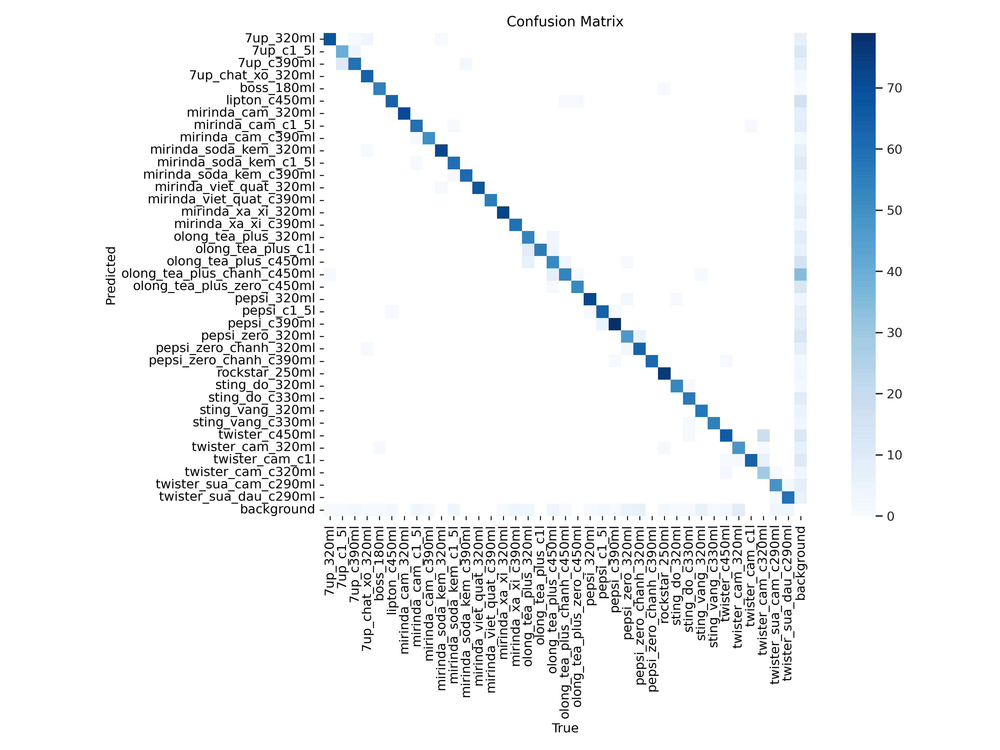

In [ ]:
# Confusion matrix shows how our model handles different classes
Image(filename=os.path.join(drive_folder, 'runs/classify/train6/confusion_matrix.png'), width=1000)

#**Training and Validation Loss**

- `train/box_loss`: This is the value of the loss function associated with predicting bounding boxes during the training process.
- `val/box_loss`: Similar to train/box_loss, but calculated during the validation process.
- `train/cls_loss`: This is the value of the loss function related to predicting the class of objects during the training process.
- `val/cls_loss`: Similar to train/cls_loss, but calculated during the validation process.
- `train/dfl_loss`: This is the value of the loss function related to adjusting the translation of bounding boxes during the training process.
- `val/dfl_loss`: Similar to train/dfl_loss, but calculated during the validation process.
- `metrics/precision(B)`: This is the accuracy of the model in predicting bounding boxes during the evaluation process. Precision is the ratio of accurately predicted boxes to the total predicted boxes.
- `metrics/recall(B)`: This is the coverage of the model in predicting bounding boxes during the evaluation process. Recall is the ratio of accurately predicted boxes to the total actual boxes.
- `metrics/mAP50(B)`: This is the average value of the Average Precision at the IoU threshold of 50% across all classes and images during the evaluation process.
- `metrics/mAP50-95(B)`: Similar to metrics/mAP50(B), but calculates the average accuracy from the IoU threshold of 50% to 95%.

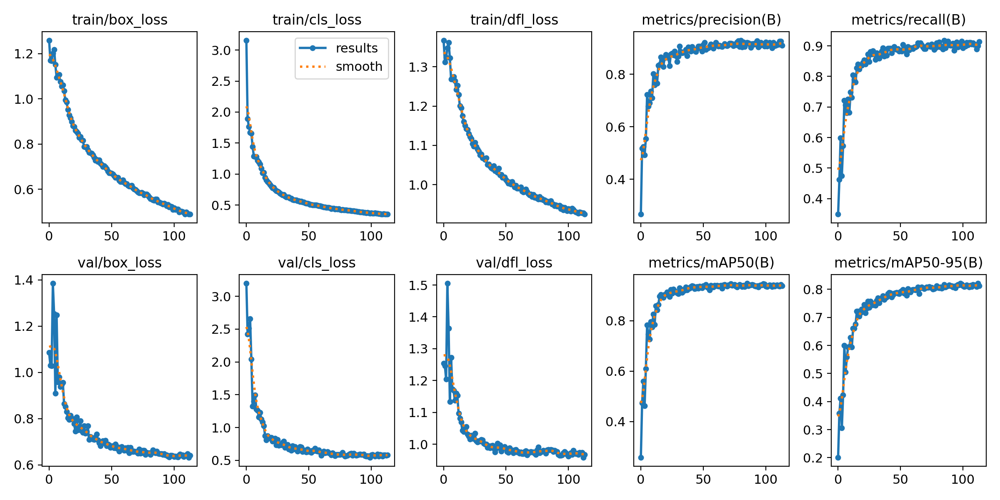

In [ ]:
# Training và validation loss graph
## Box loss and class loss are two important parameters.

Image(filename=os.path.join(drive_folder, 'runs/classify/train6/results.png'), width=800)

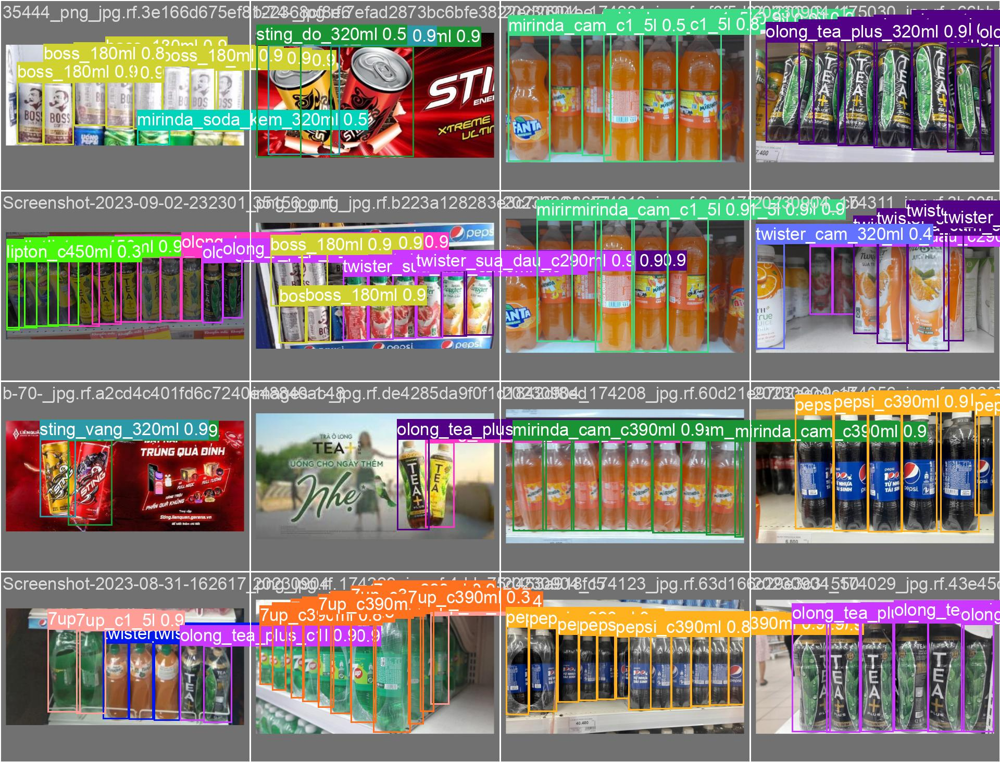

In [ ]:
# Model Prediction on validation batch.

Image(filename=os.path.join(drive_folder, 'runs/classify/train6/val_batch0_pred.jpg'), width=600)


# Validate Custom Model

- `Class`: The specific object that the detection model is being evaluated on.
- `Images`: The number of images in the test dataset used to evaluate the model.
- `Instances`: The total count of detected object instances across all images in the test dataset.
- `Box (Precision - P)`: The ratio of accurately detected bounding boxes to the total predicted boxes. It measures the model's ability to create bounding boxes without errors.
- `Recall (R)`: The ratio of accurately detected bounding boxes to the total actual boxes in the test dataset. It measures the model's ability to capture all real objects.
- `mAP50 (Mean Average Precision at 50)`: is an evaluation metric for the accuracy of object detection models. It combines both Precision and Recall. The mAP50 value measures the model's accurate object detection ability with a Precision threshold at 50%.
- `mAP50-95 (Mean Average Precision from 50% to 95% IoU)`: is a similar metric to mAP50, but it evaluates accuracy at different IoU thresholds ranging from 50% to 95%. IoU is the threshold that measures the overlap between bounding boxes.

In [ ]:
# sử dụng = val thay vì train.
!yolo task=classify mode=val model=f'"{os.path.join(drive_folder, 'runs/classify/train6/weights/best.pt')}"' data={yaml_location}

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25861762 parameters, 0 gradients
val: Scanning /content/drive/MyDrive/Colab Notebooks/soft-drink-detection/datasets/pepsi/valid/labels.cache... 405 images, 1 backgrounds, 0 corrupt: 100% 405/405 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4% 1/26 [00:01<00:26,  1.06s/it]WARNING ⚠️ NMS time limit 1.300s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8% 2/26 [00:03<00:40,  1.70s/it]WARNING ⚠️ NMS time limit 1.300s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 26/26 [00:14<00:00,  1.75it/s]
                   all        405       2446       0.92       0.89       0.94      0.815
             7up_320ml        405         70       0.93      0.957      0.971      0.869
             7up_c1_5l       

In [ ]:
tensorboard --logdir runs/detect/train6

Output hidden; open in https://colab.research.google.com to view.